# Usings

In [2]:
import pandas as pd
import numpy as np
import requests
import gensim
import nltk
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
datasetFull = pd.read_csv('documentFromPandasTemp.csv')

In [3]:
i = datasetFull[datasetFull['title']=='-'].index
datasetFull = datasetFull.drop(i)
datasetFull['maincontent'] = datasetFull['maincontent'].replace(['\xad', '\u3000'], '')

In [4]:
datasetFull.columns

Index(['Unnamed: 0', 'link', 'title', 'maincontent', 'Tom', 'Predydusaa_glava',
       'Glava', 'Anime', 'Personaji', 'Tehniki', 'Manga', 'Igra',
       'Pol_zovateli', 'Poavlenia', 'Klassifikazia', 'Klass', 'Dal_nost_',
       'Osnovnoe', 'Proizvodnoe', 'Element', 'Predydusij_epizod', 'Informazia',
       'Arka', 'Muzyka', 'Aponskaa', 'Gruppa', 'Nomer_Endinga',
       'Nacal_nyj_Epizod', 'Navigazia', 'Nomer_Openinga', 'Konecnyj_Epizod',
       'Fil_m', 'Novella', 'Platforma', 'Data', 'Predydusaa_igra', 'Dzuzu',
       'Snarajenie', 'Seria', 'Sleduusij_epizod', 'Prisposoblenia', 'Aponskij',
       'Data_rojdenia', 'Pol', 'Prinadlejnost_', 'Komanda', 'Rang',
       'Poavlenie', 'Anglijskij', 'Rost', 'Professia', 'Partnery', 'OVA',
       'Vozrast', 'Status', 'Rangi', 'Unikal_nye', 'Sem_a', 'Klan',
       'Anglijskaa', 'Vid', 'Raspolojenie', 'Lidery', 'Sovmestnye',
       'Sleduusaa_glava', 'Komandy', 'Izvestnye', 'Lider', 'Dannye',
       'Predydusij_tom', 'Sleduusij_tom', 'Svedenia', '

# Расставление истинных меток

In [5]:
list_of_pages = ["https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8",
                  "https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8?from=%D0%9A%D0%B0%D0%BA%D0%BE%D0%B8",
                  "https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8?from=%D0%9C%D0%B0%D0%BD%D0%B0%D0%B1%D1%83+%D0%90%D0%BA%D0%B0%D0%B4%D0%BE",
                  "https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8?from=%D0%9F%D0%BE%D1%81%D1%8B%D0%BB%D1%8C%D0%BD%D0%B0%D1%8F+%D0%AF%D1%89%D0%B5%D1%80%D0%B8%D1%86%D0%B0",
                  "https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8?from=%D0%A2%D0%B5%D0%BC%D1%83%D0%B4%D0%B6%D0%B8%D0%BD",
                  "https://naruto.fandom.com/ru/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%9F%D0%B5%D1%80%D1%81%D0%BE%D0%BD%D0%B0%D0%B6%D0%B8?from=%D0%A6%D1%83%D0%BA%D0%B0%D0%B4%D0%BE"]
titleofPages = set()
for i in list_of_pages:
    source = requests.get(i)
    soup = BeautifulSoup(source.content)
    div = soup.select("div.category-page__members")[0]
    for a in div.findAll('a', recursive=True):
        if(len(a.text.replace('\n', ''))!=0):
            titleofPages.add(a.text)

In [6]:
datasetFull['Персонаж'] = np.where(datasetFull['title'].isin(titleofPages), 1, 0)

# Создание обучающей выборки

In [182]:
sub_dataset = datasetFull[datasetFull['Персонаж']==1][:200]
sub_dataset = sub_dataset.append(datasetFull[datasetFull['Персонаж']==0].iloc[:500])
sub_dataset = shuffle(sub_dataset)
# Оставляем только нужное
sub_dataset = sub_dataset[['title', 'maincontent', 'Персонаж']].copy()
sub_dataset = sub_dataset.reset_index()

# Токенизируем

In [183]:
from nltk.tokenize import RegexpTokenizer
tk = RegexpTokenizer(r'[а-яёa-z]+')
sub_dataset['maincontent'] = sub_dataset['maincontent'].str.lower()
maincontent_tokens = [tk.tokenize(sent) for sent in sub_dataset['maincontent']]
for i in range(len(maincontent_tokens)):
    maincontent_tokens[i] = [w for w in maincontent_tokens[i] if w not in stopwords.words('russian')]

In [184]:
maincontent_tokens

[['аматерасу',
  'окутывающее',
  'огонь',
  'пламя',
  'яп',
  'аматэрасу',
  'энтэнка',
  'техника',
  'ходе',
  'применения',
  'которой',
  'управляемое',
  'пламя',
  'аматерасу',
  'используется',
  'покрыть',
  'рёбра',
  'сусаноо',
  'пламенем',
  'окружая',
  'пользователя',
  'щитом',
  'чёрного',
  'огня',
  'помимо',
  'урона',
  'который',
  'техника',
  'нанести',
  'обладает',
  'психологическим',
  'эффектом',
  'заставляя',
  'врагов',
  'ближнего',
  'боя',
  'колебаться',
  'нападении',
  'пользователя',
  'техники'],
 ['аматерасу',
  'окутывающее',
  'огонь',
  'пламя',
  'яп',
  'аматэрасу',
  'энтэнка',
  'техника',
  'ходе',
  'применения',
  'которой',
  'управляемое',
  'пламя',
  'аматерасу',
  'используется',
  'покрыть',
  'рёбра',
  'сусаноо',
  'пламенем',
  'окружая',
  'пользователя',
  'щитом',
  'чёрного',
  'огня',
  'помимо',
  'урона',
  'который',
  'техника',
  'нанести',
  'обладает',
  'психологическим',
  'эффектом',
  'заставляя',
  'врагов',


# Загрузка pre-trained word2vec модели с rusvectors

In [185]:
w2vModel = gensim.models.KeyedVectors.load_word2vec_format('model.bin', binary=True)

In [186]:
w2vModel.most_similar('саскэ_PROPN')

[('итатя_PROPN', 0.7673621773719788),
 ('наруто_ADV', 0.7612249851226807),
 ('конох_PROPN', 0.7555226683616638),
 ('оротимара_PROPN', 0.7409914135932922),
 ('ичиго_PROPN', 0.6938236355781555),
 ('какася_PROPN', 0.6815880537033081),
 ('синоба_NOUN', 0.6766641736030579),
 ('сакура_PROPN', 0.6486595273017883),
 ('наруто_PROPN', 0.6409454941749573),
 ('кэнсин_PROPN', 0.6375011801719666)]

In [187]:
print('ниндзя_NOUN' in w2vModel.key_to_index)

True


# Раздаём Universal теги

In [188]:
import ufal.udpipe as udp
import corpy.udpipe as crp
import wget 
import os
udp_model_url = r'https://lindat.mff.cuni.cz/repository/xmlui/bitstream/handle/11234/1-3131/russian-syntagrus-ud-2.5-191206.udpipe'
udp_model_filename = udp_model_url.rsplit('/', 1)[-1]
if not os.path.isfile(udp_model_filename):
  wget.download(udp_model_url)
corpy_model = crp.Model(udp_model_filename)

In [189]:
def tagging(lem_text):
  sents = [list(corpy_model.process(w)) for w in lem_text]
  tagged_words = [s[0].words[1].form + '_' + s[0].words[1].upostag for s in sents if s]
  return tagged_words

In [190]:
maincontent_tokens_tagged = maincontent_tokens
for i in range(0, len(maincontent_tokens)):
    maincontent_tokens_tagged[i]=tagging(maincontent_tokens_tagged[i])

In [191]:
documents = []
for x in maincontent_tokens_tagged:
    document = [word for word in x if word in w2vModel.key_to_index]
    documents.append(document)

In [192]:
documents

[['огонь_NOUN',
  'пламя_NOUN',
  'яп_NOUN',
  'техника_NOUN',
  'пламя_NOUN',
  'покрыть_VERB',
  'техника_NOUN',
  'нанести_VERB',
  'боя_NOUN',
  'колебаться_VERB'],
 ['огонь_NOUN',
  'пламя_NOUN',
  'яп_NOUN',
  'техника_NOUN',
  'пламя_NOUN',
  'покрыть_VERB',
  'техника_NOUN',
  'нанести_VERB',
  'боя_NOUN',
  'колебаться_VERB'],
 ['братья_NOUN',
  'глава_NOUN',
  'наруто_ADV',
  'яд_NOUN',
  'сакура_NOUN',
  'одно_NUM',
  'нейтрализовать_VERB',
  'содержание_NOUN',
  'сознание_NOUN',
  'клочок_NOUN',
  'время_NOUN',
  'помочь_VERB',
  'определить_VERB',
  'местоположение_NOUN',
  'наруто_ADV',
  'спас_NOUN',
  'брата_NOUN',
  'изначально_ADV',
  'добровольно_ADV',
  'отправиться_VERB',
  'увидеть_VERB',
  'время_NOUN',
  'вместе_ADV',
  'членов_NOUN'],
 ['яп_NOUN',
  'эпизод_NOUN',
  'наруто_ADV',
  'яркий_ADJ',
  'свет_NOUN',
  'тоби_NOUN',
  'команда_NOUN',
  'поле_NOUN',
  'боя_NOUN',
  'корни_NOUN',
  'бога_NOUN',
  'несмотря_ADV',
  'спасти_VERB',
  'положение_NOUN',
  'тоб

# Прогоняем через модель w2v слова

In [193]:
list_v=[]
for i in range (0,len(documents)):
    list_v.append(np.mean(w2vModel[documents[i]], axis=0))

In [194]:
list_v

[array([ 1.7269845e-01, -7.0912397e-01,  5.7504731e-01, -4.6084699e-01,
         9.0096351e-03, -1.3621731e-01, -1.5103160e-01,  1.3541186e+00,
         3.3666946e-02, -3.1189546e-01,  2.1201284e-01,  2.4740143e-01,
        -9.3588686e-01,  1.8303503e-01,  2.0921378e-01, -5.7173364e-02,
         1.4981998e+00, -1.0179343e+00, -7.5009984e-01,  5.5463076e-01,
        -3.9848942e-01, -5.7286280e-01,  3.2763714e-01,  1.3822851e-01,
        -6.9056666e-01,  1.3471556e-01,  1.4467156e+00,  1.5360264e+00,
         1.4782905e-03, -4.4016162e-01,  7.7048647e-01, -8.0504894e-01,
         1.4602062e+00,  1.2036737e+00,  2.0429146e-01, -9.5357284e-02,
        -1.0047913e-02,  5.7102108e-01, -2.7253902e-01, -1.6178057e+00,
         1.8790308e-01,  1.8633342e-01, -1.5075731e+00, -2.7179578e-01,
         1.1623490e+00,  1.0800266e+00,  2.2767523e-01,  1.4437532e+00,
         3.9439401e-01, -6.2228644e-01,  3.2220727e-01, -1.5853241e-01,
        -1.3726529e-01,  3.4991106e-01,  1.2691747e+00, -1.18801

In [195]:
sub_dataset['doc_vec']=list_v

# Делим данные и обучаем Логистическую регрессию

In [325]:
X = list_v
y = sub_dataset[['title','Персонаж']]
x_train, x_test, y_train,  y_test = train_test_split(X, y, test_size=0.3)

In [326]:
len(list_v)

700

In [327]:
lr = LogisticRegression(C=10, max_iter = 500, solver = 'liblinear')
lr.fit(x_train, y_train['Персонаж'])

LogisticRegression(C=10, max_iter=500, solver='liblinear')

In [354]:
submission = pd.DataFrame.from_dict({'title': y_test['title'], 'true_mark':y_test['Персонаж']})

In [355]:
y_test[y_test['Персонаж'] == 1].count()

title       54
Персонаж    54
dtype: int64

In [356]:
submission['predicted_mark'] = lr.predict_proba(x_test)[:, 1]

In [360]:
submission[submission['predicted_mark']>0.6][['title', 'predicted_mark']].count()

title             50
predicted_mark    50
dtype: int64

In [359]:
submission[submission['predicted_mark']>0.6][['title', 'predicted_mark']]

,title,predicted_mark
411,Гандо,0.624774
167,Гамамару,0.979522
203,Гамакен,0.999203
227,Амино,1.000000
375,Блошиный Сюрикен,0.689166
244,Байу,0.999755
309,Большой Шар Расенгана,0.621686
463,Баджи,0.813832
328,Бараки,0.814365
623,Битва Жизни и Смерти!! (Том),0.716235


Column: Персонаж


Text(0.5, 1.0, 'Reciever Operating Characteristic')

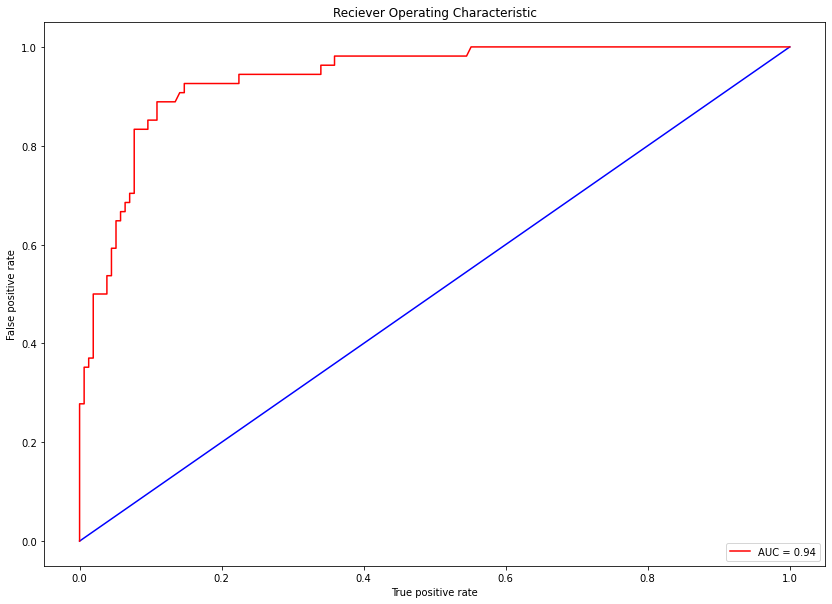

In [332]:
from sklearn.metrics import roc_curve,auc
import matplotlib.pyplot as plt
col = 'Персонаж'
print("Column:",col)
pred_pro = lr.predict_proba(x_test)[:,1]
frp,trp,thres = roc_curve(y_test['Персонаж'],pred_pro)
auc_val =auc(frp,trp)
plt.figure(figsize=(14,10))
plt.plot([0,1],[0,1],color='b')
plt.plot(frp,trp,color='r',label= 'AUC = %.2f'%auc_val)
plt.legend(loc='lower right')
plt.xlabel('True positive rate')
plt.ylabel('False positive rate')
plt.title('Reciever Operating Characteristic')

# Классификация целого документа

In [333]:
tk = RegexpTokenizer(r'[а-яёa-z]+')
datasetFull['maincontent'] = datasetFull['maincontent'].str.lower()
maincontent_tokens = [tk.tokenize(sent) for sent in datasetFull['maincontent']]
for i in range(len(maincontent_tokens)):
    maincontent_tokens[i] = [w for w in maincontent_tokens[i] if w not in stopwords.words('russian')]

In [334]:
udp_model_url = r'https://lindat.mff.cuni.cz/repository/xmlui/bitstream/handle/11234/1-3131/russian-syntagrus-ud-2.5-191206.udpipe'
udp_model_filename = udp_model_url.rsplit('/', 1)[-1]
if not os.path.isfile(udp_model_filename):
  wget.download(udp_model_url)
corpy_model = crp.Model(udp_model_filename)

In [335]:
maincontent_tokens_tagged = maincontent_tokens
for i in range(0, len(maincontent_tokens)):
    maincontent_tokens_tagged[i]=tagging(maincontent_tokens_tagged[i])

In [336]:
documents = []
for x in maincontent_tokens_tagged:
    document = [word for word in x if word in w2vModel.key_to_index]
    documents.append(document)

In [339]:
documents

[['война_NOUN',
  'яп_NOUN',
  'глава_NOUN',
  'наруто_ADV',
  'дивизия_NOUN',
  'взят_VERB',
  'плен_NOUN',
  'мороза_NOUN',
  'взвод_NOUN',
  'бой_NOUN',
  'сил_NOUN',
  'сай_NOUN',
  'брат_NOUN',
  'меч_NOUN',
  'говорит_VERB',
  'сталкивать_VERB'],
 ['мать_NOUN',
  'яп_NOUN',
  'отец_NOUN',
  'яп_NOUN',
  'время_NOUN',
  'попытка_NOUN',
  'воссоздать_VERB',
  'любовь_NOUN',
  'потеряв_VERB',
  'стало_VERB',
  'хватать_VERB',
  'любви_NOUN',
  'совершенно_ADV',
  'бабушка_NOUN',
  'воссоздать_VERB',
  'любовь_NOUN',
  'выполнить_VERB',
  'сильно_ADV',
  'перешли_VERB',
  'владение_NOUN',
  'гибель_NOUN',
  'рук_NOUN',
  'отца_NOUN',
  'матери_NOUN',
  'время_NOUN',
  'время_NOUN',
  'чие_NOUN',
  'отца_NOUN',
  'мать_NOUN',
  'запросто_ADV',
  'песка_NOUN',
  'отец_NOUN',
  'мать_NOUN',
  'песка_NOUN',
  'чие_NOUN',
  'нанести_VERB',
  'последний_ADJ',
  'удар_NOUN',
  'ядро_NOUN',
  'виду_NOUN',
  'возможность_NOUN',
  'умереть_VERB',
  'пока_ADV',
  'душа_NOUN',
  'призыв_NOUN',
 

In [340]:
list_v=[]
for i in range (0,len(documents)):
    if documents[i] == []:
        list_v.append(np.zeros(300,))
    else:
        list_v.append(np.mean(w2vModel[documents[i]], axis=0))

In [341]:
probas = lr.predict_proba(list_v)[:, 1]


In [342]:
datasetFull['probas'] = probas

In [345]:
datasetFull['Personaji'] = np.where(datasetFull['probas']>0.8, datasetFull['title'], datasetFull['Personaji'])

In [346]:
del datasetFull['probas']


In [349]:
del datasetFull['Персонаж']
del datasetFull['Unnamed: 0']


In [350]:
datasetFull

,link,title,maincontent,Tom,Predydusaa_glava,Glava,Anime,Personaji,Tehniki,Manga,...,Lider,Dannye,Predydusij_tom,Sleduusij_tom,Svedenia,Translazii,Orujie,Svazannye,Statistika,id
0,https://naruto.fandom.com/ru/wiki/%22%D0%92%D0...,"""Война"" Омои!!","""война"" омои!! (яп.オモイの｢戦争｣!!, омои но сэнсоу!...","Великая Война Грядёт!, (#55)",Речь Гаары,"Наруто, #517","Наруто: Шиппууден, Эпизод 262","Даймё Мороза, Даймё Горячих Источников","Стиль Облака Обезглавливание Полумесяца, Стихи...",None,...,None,None,None,None,None,None,None,None,None,0
1,https://naruto.fandom.com/ru/wiki/%22%D0%9C%D0...,"""Мать"" и ""Отец""","мать (яп.母, хаха) и отец (яп.父, чичи) — первые...",None,None,None,"Наруто: Шиппууден, Эпизод 22",None,None,"Наруто, Том 30, Глава 267",...,None,None,None,None,None,None,None,None,None,1
3,https://naruto.fandom.com/ru/wiki/100%25_%D0%A...,100% Удар,"100% удар (яп.100％シングルパンチ, 100-паасенто щингур...",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,3
4,https://naruto.fandom.com/ru/wiki/100-%D0%BC%D...,100-метровый Удар,"100-метровый удар (яп.100mパンチ, 100 панчи) — ос...",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,4
5,https://naruto.fandom.com/ru/wiki/1000-%D0%BC%...,1000-метровый Удар,"1000-метровый удар (яп.1000mパンチ, 1000м панчи) ...",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2683,https://naruto.fandom.com/ru/wiki/%D0%AF%D1%82...,Ятого Рьюген,"ятого рьюген (яп.りゅうげんヤトゴ,рьюген ятого) — чуун...",None,None,None,"Наруто: Шиппууден, Эпизод 335",Ятого Рьюген,None,"Наруто, Том 61, Глава 581",...,None,None,None,None,None,None,None,None,None,2683
2684,https://naruto.fandom.com/ru/wiki/%D0%AF%D1%85...,Яхико,"яхико(яп.弥彦, яхико) был шиноби из деревни скры...",None,None,None,"Наруто: Шиппууден, Эпизод 128",None,"Стихия Воды: Неукротимая Водяная Волна, Стихия...","Наруто, Том 41, Глава 372",...,None,None,None,None,None,None,None,None,None,2684
2685,https://naruto.fandom.com/ru/wiki/%D0%AF%D1%88...,Яшамару,"яшамару (яп.夜叉丸, ящамару) был анбу из деревни ...",None,None,None,"Наруто, Эпизод 50",Яшамару,"Управляемые Атакующие Клинки, Небесная Кара","Наруто, Том 15, Глава 129",...,None,None,None,None,None,None,None,None,None,2685
2686,https://naruto.fandom.com/ru/wiki/%D0%AF%D1%88...,Яширо Учиха,"яширо учиха (яп.八代サスケ, учиха яширо) был членом...",None,None,None,"Наруто, Эпизод 129",None,None,"Наруто, Том 25, Глава 221",...,None,None,None,None,None,None,None,None,None,2686


In [351]:
datasetFull.to_csv('Word2VecCSV.csv')